# Reinforcement Learning: DQN

- As before, please keep the names of the layer consistent with what is requested in model.py. Otherwise the test functions will not work

- You will need to fill in the model.py, DQN.py, replay_buffer.py, and env_wrapper.py.

To avoid pain with installation and model training, please use Colab for this project. DO NOT use Windows for this project. If you use Mac, there might be some potential test case failures you need to address with extra effort.

## Set up

In [1]:
# mount it if you use Colab
from google.colab import drive

drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
# TODO: change the dir to your folder
import os
REPO = "ECE-247B-Project4-GroupRepo"
if not os.path.exists(f"/content/{REPO}"):
    !git clone https://github.com/joshuah512tw/{REPO}.git
%cd /content/{REPO}/Project4/DQN
!ls

%cd /content/ECE-247B-Project4-GroupRepo/Project4/DQN

/content/ECE-247B-Project4-GroupRepo/Project4/DQN
DDPG.png	__pycache__	  test_outputs_v3.pt
DQN.png		replay_buffer.py  test_replay_buffer_inputs.pkl
DQN.py		rl.ipynb	  test_replay_buffer_samples.pth
env_wrapper.py	rl_test.py	  test_weights.pt
model.py	test_outputs.pt   utils.py
/content/ECE-247B-Project4-GroupRepo/Project4/DQN


In [3]:
%cd /content/ECE-247B-Project4-GroupRepo
!git pull
%cd Project4/DQN

/content/ECE-247B-Project4-GroupRepo
Already up to date.
/content/ECE-247B-Project4-GroupRepo/Project4/DQN


In [4]:
%load_ext autoreload
%autoreload 2

ModuleNotFoundError: No module named 'imp'

In [5]:
!pip install numpy torch wandb swig matplotlib termcolor
!pip install gymnasium
!pip install gymnasium[box2d]

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 11.0 MB/s eta 0:00:00
  Attempting uninstall: sympy
    Found existing installation: sympy 1.13.1
    Uninstalling sympy-1.13.1:
      Successfully uninstalled sympy-1.13.1


In [6]:
import rl_test
from utils import *

## Introduction to the Enviroment (5 points)
We will be training a DQN agent to play the game of CarRacing. The agent will be trained to play the game using the pixels of the game as an input. The reward structure is as follows for each frame:
- -0.1 for each frame
- +1000/N where N is the number of tiles visited by the car in the episode

The overall goal of this game is to design a agent that is able to play the game with a average test score of above 600. In discrete mode the actions can take 5 actions,
- 0: Do Nothing
- 1: Turn Left
- 2: Turn Right
- 3: Accelerate
- 4: Brake

First let us visualize the game and understand the environment.

In [7]:
import gymnasium as gym
import numpy as np

env = gym.make("CarRacing-v3", continuous=False, render_mode="rgb_array")
env.np_random = np.random.RandomState(42)

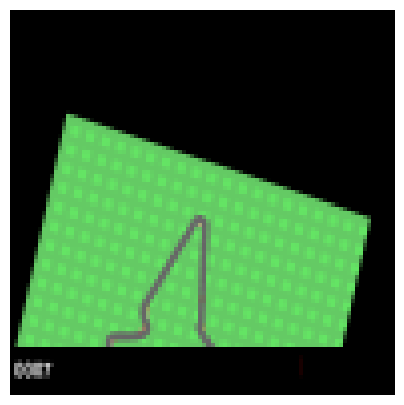

In [ ]:
from IPython.display import HTML

frames = []
s, _ = env.reset()

while True:
    a = env.action_space.sample()
    s, r, terminated, truncated, _ = env.step(a)
    frames.append(s)
    if terminated or truncated:
        break

anim = animate(frames)
HTML(anim.to_jshtml())

So a couple things we can note:
- at the beginning of the game, we have 50 frames of the game slowly zooming into the car, we should ignore this period, ie no-op during this period.
- there is a black bar at the bottom of the screen, we should crop this out of the observation.

In addition, another thing to note is that the current frame doesn't give much information about the velocity and acceleration of the car, and that the car does not move much for each frame.

### Environment Wrapper (5 points)
As a result, you will need to complete `EnvWrapper` in `env_wrapper.py`. You can find more information in the docstring for the wrapper, however the main idea is that it is a wrapper to the environment that does the following:
- skips the first 50 frames of the game
- crops out the black bar and reshapes the observation to a 84x84 image, as well as turning the resulting image to grayscale
- performs the actions for `skip_frames` frames
- stacks the last `num_frames` frames together to give the agent some information about the velocity and acceleration of the car.


In [ ]:
from env_wrapper import EnvWrapper

rl_test.test_wrapper(EnvWrapper)

Passed reset
Passed step


## DQN (25 points)

### CNN Model (5 points)
Now we are ready to build the model. Our architecture of the CNN model is the one proposed by Mnih et al in "Human-level control through deep reinforcement learning". Specifically this consists of the following layers:
- A convolutional layer with 32 filters of size 8x8 with stride 4 and relu activation
- A convolutional layer with 64 filters of size 4x4 with stride 2 and relu activation
- A convolutional layer with 64 filters of size 3x3 with stride 1 and relu activation
- A fully connected layer with 512 units and relu activation
- A fully connected layer with the number of outputs of the environment

Please implement this model `Nature_Paper_Conv` in `model.py` as well as the helper
`MLP` class.

In [ ]:
import model

rl_test.test_model_DQN(model.Nature_Paper_Conv)

Passed


Now we are ready to implement the DQN algorithm.

![title](https://github.com/joshuah512tw/ECE-247B-Project4-GroupRepo/blob/main/Project4/DQN/DQN.png?raw=1)

### Replay Buffer (5 points)
First start by implementing the DQN replay buffer `ReplayBufferDQN` in `replay_buffer.py`. This buffer will store the transitions of the agent and sample them for training.

In [ ]:
from replay_buffer import ReplayBufferDQN

rl_test.test_DQN_replay_buffer(ReplayBufferDQN)

Passed



### DQN (15 points)
Now implement the `_optimize_model` and `_sample_action` functions in `DQN` in `DQN.py`. The `_optimize_model` function will sample a batch of transitions from the replay buffer and update the model. The `_sample_action` function will sample an action from the model given the current state. Train the model over 200 episdoes, validating every 50 episodes for 30 episodes, before testing the model for 50 episodes at the end.

In [ ]:
import wandb

In [ ]:
wandb.login()

In [ ]:
wandb.init(project="racing-car-dqn")

In [ ]:
import DQN
import utils
import torch

# if running with Colab T4 with wandb, it takes 60-70 mins
# if running with Colab T4 w/o wandb, it takes ~30 mins
# your test mean reward idealy should be larger than 400
trainerDQN = DQN.DQN(
    EnvWrapper(env),
    model.Nature_Paper_Conv,
    lr=0.00025,
    gamma=0.95,
    buffer_size=100000,
    batch_size=32,
    loss_fn="mse_loss",
    use_wandb=False,
    device="cuda",
    seed=42,
    epsilon_scheduler=utils.exponential_decay(1, 700, 0.1),
    save_path=utils.get_save_path("DQN", "./runs/"),
)

trainerDQN.train(200, 50, 30, 50, 50)

saving to ./runs/DQN/run0
Episode: 0: Time: 8.488783359527588 Total Reward: -50.128205128206005 Avg_Loss: 0.0
Episode: 1: Time: 12.248075723648071 Total Reward: 3.5401459854016304 Avg_Loss: 0.842728573615384
Episode: 2: Time: 10.185993909835815 Total Reward: -30.714285714285655 Avg_Loss: 0.9730987670291372
Episode: 3: Time: 9.762268304824829 Total Reward: -110.95892255892305 Avg_Loss: 1.0694442984757122
Episode: 4: Time: 10.413812398910522 Total Reward: -24.577464788732463 Avg_Loss: 11.51473899598883
Episode: 5: Time: 2.5248117446899414 Total Reward: -82.11526717557278 Avg_Loss: 1.0543080762517256
Episode: 6: Time: 9.987819910049438 Total Reward: 22.187500000001094 Avg_Loss: 13.366718109133615
Episode: 7: Time: 10.249649286270142 Total Reward: 24.5652173913048 Avg_Loss: 14.363438442599874
Episode: 8: Time: 10.516829013824463 Total Reward: -15.454545454546096 Avg_Loss: 9.635163804625764
Episode: 9: Time: 10.309492588043213 Total Reward: -13.300653594771953 Avg_Loss: 5.959617253862509
Ep

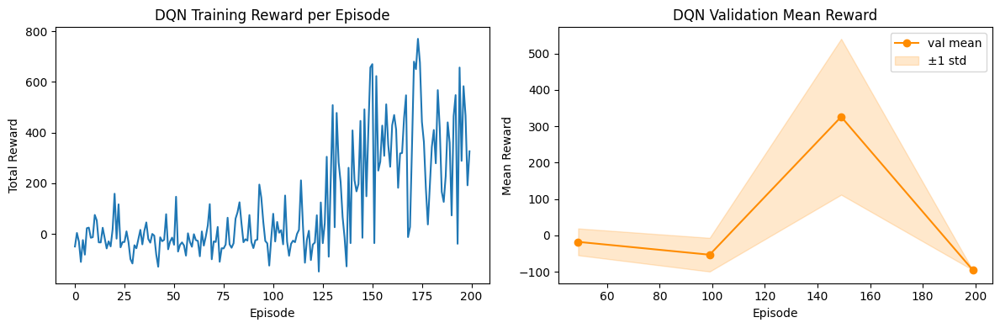

In [11]:
import re
import matplotlib.pyplot as plt

log = """
saving to ./runs/DQN/run0
Episode: 0: Time: 8.488783359527588 Total Reward: -50.128205128206005 Avg_Loss: 0.0
Episode: 1: Time: 12.248075723648071 Total Reward: 3.5401459854016304 Avg_Loss: 0.842728573615384
Episode: 2: Time: 10.185993909835815 Total Reward: -30.714285714285655 Avg_Loss: 0.9730987670291372
Episode: 3: Time: 9.762268304824829 Total Reward: -110.95892255892305 Avg_Loss: 1.0694442984757122
Episode: 4: Time: 10.413812398910522 Total Reward: -24.577464788732463 Avg_Loss: 11.51473899598883
Episode: 5: Time: 2.5248117446899414 Total Reward: -82.11526717557278 Avg_Loss: 1.0543080762517256
Episode: 6: Time: 9.987819910049438 Total Reward: 22.187500000001094 Avg_Loss: 13.366718109133615
Episode: 7: Time: 10.249649286270142 Total Reward: 24.5652173913048 Avg_Loss: 14.363438442599874
Episode: 8: Time: 10.516829013824463 Total Reward: -15.454545454546096 Avg_Loss: 9.635163804625764
Episode: 9: Time: 10.309492588043213 Total Reward: -13.300653594771953 Avg_Loss: 5.959617253862509
Episode: 10: Time: 10.613809585571289 Total Reward: 74.67509025271204 Avg_Loss: 14.129848626043115
Episode: 11: Time: 11.111201286315918 Total Reward: 53.03625377643786 Avg_Loss: 8.71735032766807
Episode: 12: Time: 10.686992168426514 Total Reward: -33.566552901024345 Avg_Loss: 26.562095625310384
Episode: 13: Time: 10.688620805740356 Total Reward: -33.98305084745844 Avg_Loss: 9.052173977263836
Episode: 14: Time: 10.670334815979004 Total Reward: 23.971061093247855 Avg_Loss: 9.66897111148143
Episode: 15: Time: 10.937485933303833 Total Reward: -17.807017543860287 Avg_Loss: 94.1315556634374
Episode: 16: Time: 10.644896268844604 Total Reward: -57.711864406780236 Avg_Loss: 526.5226591124255
Episode: 17: Time: 11.20732069015503 Total Reward: -29.579439252337117 Avg_Loss: 66.22312880063258
Episode: 18: Time: 11.396663188934326 Total Reward: -49.69255663430491 Avg_Loss: 33.586941467363296
Episode: 19: Time: 11.122049570083618 Total Reward: 17.676056338028697 Avg_Loss: 53.98997889045908
Episode: 20: Time: 10.711191415786743 Total Reward: 158.37837837838202 Avg_Loss: 50.268294433084854
Episode: 21: Time: 7.117499113082886 Total Reward: -19.009929078012675 Avg_Loss: 74.28476061717963
Episode: 22: Time: 10.894265413284302 Total Reward: 116.46953405017888 Avg_Loss: 85.02701369053176
Episode: 23: Time: 10.42563772201538 Total Reward: -53.33333333333405 Avg_Loss: 29.203378281673462
Episode: 24: Time: 9.910738229751587 Total Reward: -32.72893772893845 Avg_Loss: 47.94511534586674
Episode: 25: Time: 9.767599821090698 Total Reward: -32.06293706293778 Avg_Loss: 60.71890727411799
Episode: 26: Time: 10.520925521850586 Total Reward: 9.895104895104259 Avg_Loss: 36.26128210540579
Episode: 27: Time: 10.754165172576904 Total Reward: -32.30407523511039 Avg_Loss: 26.670436045953206
Episode: 28: Time: 7.173995018005371 Total Reward: -99.99859154929615 Avg_Loss: 24.509463937864417
Episode: 29: Time: 7.656375169754028 Total Reward: -117.0523297491044 Avg_Loss: 28.853992158716377
Episode: 30: Time: 9.985458135604858 Total Reward: -45.000000000000725 Avg_Loss: 34.078512852682785
Episode: 31: Time: 10.707884073257446 Total Reward: -56.97718631178779 Avg_Loss: 10.693972901135934
Episode: 32: Time: 10.959781646728516 Total Reward: -19.83660130719025 Avg_Loss: 11.63776519118237
Episode: 33: Time: 11.210449695587158 Total Reward: 15.759493670886016 Avg_Loss: 9.104131776244701
Episode: 34: Time: 10.607525825500488 Total Reward: -41.54088050314536 Avg_Loss: 10.45310058751527
Episode: 35: Time: 10.999197006225586 Total Reward: 11.312292358804774 Avg_Loss: 168.1638069696286
Episode: 36: Time: 11.009188890457153 Total Reward: 45.186915887851505 Avg_Loss: 229.21122848186172
Episode: 37: Time: 10.27685546875 Total Reward: -20.373134328358915 Avg_Loss: 26.831330565594826
Episode: 38: Time: 10.860260248184204 Total Reward: -34.873417721519715 Avg_Loss: 20.584998730350943
Episode: 39: Time: 10.76752495765686 Total Reward: -0.45454545454644 Avg_Loss: 22.160164723125828
Episode: 40: Time: 10.034341096878052 Total Reward: -7.213740458015431 Avg_Loss: 18.523998635155813
Episode: 41: Time: 4.9102702140808105 Total Reward: -81.60000000000052 Avg_Loss: 16.368651724613464
Episode: 42: Time: 5.982638359069824 Total Reward: -129.9090909090911 Avg_Loss: 19.605740653904707
Episode: 43: Time: 11.284931182861328 Total Reward: -13.644067796611012 Avg_Loss: 18.672267712965734
Episode: 44: Time: 8.034980773925781 Total Reward: -29.164383561641543 Avg_Loss: 21.79925928790061
Episode: 45: Time: 10.249628067016602 Total Reward: -23.571428571429312 Avg_Loss: 13.816501115300074
Episode: 46: Time: 10.863999843597412 Total Reward: 77.52396166134191 Avg_Loss: 12.068975942225016
Episode: 47: Time: 10.09745979309082 Total Reward: -60.98639455782366 Avg_Loss: 32.2499231911507
Episode: 48: Time: 9.916718006134033 Total Reward: -30.37414965986467 Avg_Loss: 20.01469294488931
Episode: 49: Time: 10.774999618530273 Total Reward: -15.000000000000679 Avg_Loss: 20.811698881517938
Validation Mean Reward: -17.79118468333003 Validation Std Reward: 36.8318997388635
Episode: 50: Time: 10.859225988388062 Total Reward: -43.01223241590263 Avg_Loss: 11.807469765053076
Episode: 51: Time: 11.137539148330688 Total Reward: 146.49659863945826 Avg_Loss: 151.45705831126006
Episode: 52: Time: 10.665102005004883 Total Reward: -69.9103942652334 Avg_Loss: 207.98364889872175
Episode: 53: Time: 10.679301261901855 Total Reward: -43.529411764706595 Avg_Loss: 14.143860020056492
Episode: 54: Time: 9.673786640167236 Total Reward: -33.84892086331007 Avg_Loss: 10.283119520219435
Episode: 55: Time: 6.305808067321777 Total Reward: -45.639676113358135 Avg_Loss: 10.072532578900054
Episode: 56: Time: 2.3061330318450928 Total Reward: -85.96431095406382 Avg_Loss: 19.194497107355684
Episode: 57: Time: 4.29740047454834 Total Reward: 2.0942238267159325 Avg_Loss: 18.732293938853076
Episode: 58: Time: 3.654853582382202 Total Reward: -32.23749999999882 Avg_Loss: 25.978111986552967
Episode: 59: Time: 9.629600048065186 Total Reward: -51.043956043956655 Avg_Loss: 11.4386055892756
Episode: 60: Time: 11.25244951248169 Total Reward: -1.4516129032264586 Avg_Loss: 9.286781607555742
Episode: 61: Time: 10.301442861557007 Total Reward: -25.00000000000067 Avg_Loss: 9.083590525538982
Episode: 62: Time: 10.73072862625122 Total Reward: -27.862190812721344 Avg_Loss: 12.641406750979543
Episode: 63: Time: 10.184182167053223 Total Reward: -88.67315436241667 Avg_Loss: 13.612359750116694
Episode: 64: Time: 11.121437549591064 Total Reward: 9.430379746835088 Avg_Loss: 32.72826232930191
Episode: 65: Time: 10.685621738433838 Total Reward: -46.56695156695221 Avg_Loss: 17.588217634613773
Episode: 66: Time: 10.478447198867798 Total Reward: -10.254237288136274 Avg_Loss: 22.72256940052289
Episode: 67: Time: 10.669464826583862 Total Reward: 33.11387900355816 Avg_Loss: 13.141791463649573
Episode: 68: Time: 10.461926221847534 Total Reward: 117.244897959187 Avg_Loss: 180.5900740212753
Episode: 69: Time: 7.549055337905884 Total Reward: -100.45665399239616 Avg_Loss: 12.247025641438725
Episode: 70: Time: 10.175627946853638 Total Reward: -29.782608695652662 Avg_Loss: 124.32716438574951
Episode: 71: Time: 10.505314111709595 Total Reward: -32.30407523511013 Avg_Loss: 35.96511395814038
Episode: 72: Time: 11.132274627685547 Total Reward: 27.186495176847956 Avg_Loss: 234.08905564261084
Episode: 73: Time: 7.3978564739227295 Total Reward: -110.3444444444449 Avg_Loss: 232.24475729104245
Episode: 74: Time: 11.056221008300781 Total Reward: -56.93771626297595 Avg_Loss: 79.91478089875534
Episode: 75: Time: 11.421989679336548 Total Reward: -57.500000000000654 Avg_Loss: 234.90431048789947
Episode: 76: Time: 10.985242366790771 Total Reward: -42.54098360655769 Avg_Loss: 647.2204201321642
Episode: 77: Time: 10.788352966308594 Total Reward: 63.62068965517173 Avg_Loss: 157.22066471706918
Episode: 78: Time: 10.946699380874634 Total Reward: -41.66666666666738 Avg_Loss: 56.056991047718945
Episode: 79: Time: 10.503078937530518 Total Reward: -55.000000000000725 Avg_Loss: 150.21180787356963
Episode: 80: Time: 10.33956527709961 Total Reward: -37.30769230769303 Avg_Loss: 72.83593716841786
Episode: 81: Time: 10.373312711715698 Total Reward: 59.9295774647913 Avg_Loss: 68.02702955037606
Episode: 82: Time: 10.675397872924805 Total Reward: 85.00000000000298 Avg_Loss: 44.00241265276901
Episode: 83: Time: 11.192984819412231 Total Reward: 124.58456973293858 Avg_Loss: 77.32446938853305
Episode: 84: Time: 10.796093702316284 Total Reward: 41.02941176470532 Avg_Loss: 170.4144711804991
Episode: 85: Time: 10.027541875839233 Total Reward: -33.11074918566846 Avg_Loss: 51.89271251844759
Episode: 86: Time: 10.385704517364502 Total Reward: -21.31578947368492 Avg_Loss: 32.60112955690432
Episode: 87: Time: 10.362963199615479 Total Reward: -26.818181818182218 Avg_Loss: 34.05688990865435
Episode: 88: Time: 10.052231788635254 Total Reward: 74.1729323308318 Avg_Loss: 28.59412275542732
Episode: 89: Time: 10.372271537780762 Total Reward: -32.30407523511042 Avg_Loss: 14.074354248137034
Episode: 90: Time: 9.634268760681152 Total Reward: -56.24031007752011 Avg_Loss: 62.070913047349755
Episode: 91: Time: 10.060450792312622 Total Reward: -25.40293040293106 Avg_Loss: 31.391635621796134
Episode: 92: Time: 10.0538809299469 Total Reward: -23.082191780822544 Avg_Loss: 66.3380571218098
Episode: 93: Time: 10.886598587036133 Total Reward: 194.47368421052818 Avg_Loss: 43.62100260523187
Episode: 94: Time: 11.093050718307495 Total Reward: 142.5886524822737 Avg_Loss: 39.46002300546951
Episode: 95: Time: 10.341845512390137 Total Reward: 46.97530864197862 Avg_Loss: 17.239793838573103
Episode: 96: Time: 9.50603437423706 Total Reward: -28.098591549296476 Avg_Loss: 12.32596251118083
Episode: 97: Time: 11.04811429977417 Total Reward: -37.59818731117896 Avg_Loss: 13.56842780213396
Episode: 98: Time: 9.348711967468262 Total Reward: -125.3421052631585 Avg_Loss: 15.121157803513983
Episode: 99: Time: 10.683404684066772 Total Reward: -18.076923076923553 Avg_Loss: 26.57834458451311
Validation Mean Reward: -53.12749048249179 Validation Std Reward: 46.31576328566275
Episode: 100: Time: 10.853069305419922 Total Reward: 79.21602787456814 Avg_Loss: 49.17097287293242
Episode: 101: Time: 9.85399341583252 Total Reward: -30.153583617748147 Avg_Loss: 14.000517346778837
Episode: 102: Time: 10.779819011688232 Total Reward: 46.89189189189254 Avg_Loss: 24.58795971830352
Episode: 103: Time: 10.457054376602173 Total Reward: 4.337748344371166 Avg_Loss: 21.952992926625644
Episode: 104: Time: 10.492439031600952 Total Reward: 14.540636042404017 Avg_Loss: 20.951865145889652
Episode: 105: Time: 10.802416324615479 Total Reward: -41.47887323943726 Avg_Loss: 15.0466124771022
Episode: 106: Time: 10.510420322418213 Total Reward: 151.32352941176558 Avg_Loss: 12.08491263519816
Episode: 107: Time: 10.114085674285889 Total Reward: -30.810810810811535 Avg_Loss: 23.788045065493144
Episode: 108: Time: 8.3059561252594 Total Reward: -86.52222222222315 Avg_Loss: 38.57106414576268
Episode: 109: Time: 10.505659580230713 Total Reward: -39.6064139941698 Avg_Loss: 71.21651374567456
Episode: 110: Time: 10.328852415084839 Total Reward: -26.818181818182545 Avg_Loss: 57.79431210045053
Episode: 111: Time: 10.439886569976807 Total Reward: -32.93103448275875 Avg_Loss: 32.0463089872809
Episode: 112: Time: 10.480451345443726 Total Reward: -0.4545454545462908 Avg_Loss: 17.54469135578941
Episode: 113: Time: 11.212958812713623 Total Reward: 15.769230769230301 Avg_Loss: 13.111282051861787
Episode: 114: Time: 10.84218716621399 Total Reward: 211.1889250814375 Avg_Loss: 9.101305152939148
Episode: 115: Time: 10.094099998474121 Total Reward: 32.272727272729774 Avg_Loss: 11.173234458731002
Episode: 116: Time: 9.292227506637573 Total Reward: -114.03876221498436 Avg_Loss: 7.259530915493189
Episode: 117: Time: 10.462208986282349 Total Reward: -23.082191780822587 Avg_Loss: 8.064328548537583
Episode: 118: Time: 10.577500343322754 Total Reward: 12.14285714285798 Avg_Loss: 28.371042445928108
Episode: 119: Time: 10.200272798538208 Total Reward: -103.58421052631628 Avg_Loss: 22.185782349829015
Episode: 120: Time: 10.494472980499268 Total Reward: -42.058823529412464 Avg_Loss: 31.319612852665557
Episode: 121: Time: 10.39646601676941 Total Reward: -34.490445859873006 Avg_Loss: 18.53250564647322
Episode: 122: Time: 11.19634199142456 Total Reward: 73.35016835017079 Avg_Loss: 12.223578851263062
Episode: 123: Time: 10.221842527389526 Total Reward: -148.97484276729625 Avg_Loss: 10.900690680153891
Episode: 124: Time: 10.67040729522705 Total Reward: 123.8552188552236 Avg_Loss: 22.77508250354719
Episode: 125: Time: 10.75269889831543 Total Reward: -36.89602446483252 Avg_Loss: 13.852364859160256
Episode: 126: Time: 10.93817400932312 Total Reward: 41.9426751592375 Avg_Loss: 9.067635973211097
Episode: 127: Time: 11.130872011184692 Total Reward: 304.3399339933949 Avg_Loss: 10.50949927375597
Episode: 128: Time: 5.606311082839966 Total Reward: -90.24210526315849 Avg_Loss: 6.559842212876277
Episode: 129: Time: 11.065900325775146 Total Reward: 205.35335689046335 Avg_Loss: 8.484148647103991
Episode: 130: Time: 11.378893852233887 Total Reward: 508.27868852458266 Avg_Loss: 7.329290936974918
Episode: 131: Time: 11.0229651927948 Total Reward: 26.019108280256695 Avg_Loss: 8.687284102960795
Episode: 132: Time: 10.728732109069824 Total Reward: 477.438162544164 Avg_Loss: 5.792451840238411
Episode: 133: Time: 10.954947233200073 Total Reward: 282.16262975778335 Avg_Loss: 8.91048779557733
Episode: 134: Time: 10.753267765045166 Total Reward: 204.62546816479605 Avg_Loss: 6.0593161681870455
Episode: 135: Time: 10.756618738174438 Total Reward: 66.41732283464515 Avg_Loss: 6.131699835803328
Episode: 136: Time: 10.024018049240112 Total Reward: -15.318725099602167 Avg_Loss: 5.4668541164959175
Episode: 137: Time: 9.056437730789185 Total Reward: -128.52195121951274 Avg_Loss: 5.896801587212028
Episode: 138: Time: 11.337806701660156 Total Reward: 260.8282208588988 Avg_Loss: 9.905522612713966
Episode: 139: Time: 10.785805940628052 Total Reward: -36.66666666666734 Avg_Loss: 43.56299282798246
Episode: 140: Time: 11.012453079223633 Total Reward: 408.4482758620637 Avg_Loss: 9.48683305397755
Episode: 141: Time: 10.99381947517395 Total Reward: 211.6666666666695 Avg_Loss: 12.873981864512468
Episode: 142: Time: 11.040127277374268 Total Reward: 167.6865671641834 Avg_Loss: 6.308867480073657
Episode: 143: Time: 10.886560916900635 Total Reward: 196.52542372881794 Avg_Loss: 8.379660801476792
Episode: 144: Time: 10.599756956100464 Total Reward: 445.98360655736326 Avg_Loss: 5.409223945200944
Episode: 145: Time: 11.398115873336792 Total Reward: -15.588235294118247 Avg_Loss: 6.335307933703191
Episode: 146: Time: 11.011792659759521 Total Reward: 491.5384615384528 Avg_Loss: 4.30754277736199
Episode: 147: Time: 10.852197885513306 Total Reward: 148.3333333333378 Avg_Loss: 5.910967786522472
Episode: 148: Time: 10.996344804763794 Total Reward: 413.833922261479 Avg_Loss: 6.096021973535795
Episode: 149: Time: 10.679571390151978 Total Reward: 656.9999999999884 Avg_Loss: 5.566933050376027
Validation Mean Reward: 326.1071855883174 Validation Std Reward: 214.34484233206499
Episode: 150: Time: 11.18825912475586 Total Reward: 670.1515151515016 Avg_Loss: 4.787551751407254
Episode: 151: Time: 10.888699054718018 Total Reward: -36.6909620991261 Avg_Loss: 6.055264000632182
Episode: 152: Time: 10.904270648956299 Total Reward: 622.9487179487077 Avg_Loss: 6.3908374294513415
Episode: 153: Time: 10.858703374862671 Total Reward: 249.82758620688796 Avg_Loss: 6.168312083021934
Episode: 154: Time: 11.293596744537354 Total Reward: 285.1369863013607 Avg_Loss: 6.249505731989355
Episode: 155: Time: 11.058074235916138 Total Reward: 427.3880597014884 Avg_Loss: 5.153818539210728
Episode: 156: Time: 11.440699577331543 Total Reward: 308.07692307692 Avg_Loss: 4.894901917010796
Episode: 157: Time: 10.771203756332397 Total Reward: 511.382978723394 Avg_Loss: 5.950146972632208
Episode: 158: Time: 10.877968788146973 Total Reward: 353.5294117646982 Avg_Loss: 6.751288716282163
Episode: 159: Time: 11.12326717376709 Total Reward: 264.86159169549126 Avg_Loss: 7.367949059029587
Episode: 160: Time: 11.025513410568237 Total Reward: 428.64864864864256 Avg_Loss: 6.959278152019036
Episode: 161: Time: 10.96517276763916 Total Reward: 469.18918918918416 Avg_Loss: 6.991874444885414
Episode: 162: Time: 11.040729284286499 Total Reward: 411.6666666666653 Avg_Loss: 5.663339718550193
Episode: 163: Time: 10.974968671798706 Total Reward: 181.81660899654224 Avg_Loss: 6.945117893339205
Episode: 164: Time: 11.615908861160278 Total Reward: 317.307692307691 Avg_Loss: 5.905656159424982
Episode: 165: Time: 11.432037353515625 Total Reward: 319.3302180685317 Avg_Loss: 6.299301755027611
Episode: 166: Time: 11.263733863830566 Total Reward: 457.9010238907752 Avg_Loss: 8.815967864849988
Episode: 167: Time: 11.12728762626648 Total Reward: 547.1404682274165 Avg_Loss: 7.4811648481032424
Episode: 168: Time: 10.411921501159668 Total Reward: -12.808219178082732 Avg_Loss: 18.595501506528933
Episode: 169: Time: 9.855874300003052 Total Reward: 26.951219512197326 Avg_Loss: 6.017087126980309
Episode: 170: Time: 11.3943612575531 Total Reward: 344.1691394658733 Avg_Loss: 9.707483298638287
Episode: 171: Time: 11.282299280166626 Total Reward: 679.9999999999869 Avg_Loss: 5.800409524881539
Episode: 172: Time: 11.042640447616577 Total Reward: 650.3874538745318 Avg_Loss: 8.158049734199748
Episode: 173: Time: 10.962043762207031 Total Reward: 770.0793650793571 Avg_Loss: 6.966218364338915
Episode: 174: Time: 10.91518497467041 Total Reward: 676.5355805243348 Avg_Loss: 7.735034815403593
Episode: 175: Time: 11.03489637374878 Total Reward: 442.3665480426968 Avg_Loss: 7.8627844337655715
Episode: 176: Time: 10.794389486312866 Total Reward: 362.56457564575555 Avg_Loss: 12.948087003551612
Episode: 177: Time: 10.970524787902832 Total Reward: 179.24749163880077 Avg_Loss: 175.54984216730134
Episode: 178: Time: 11.17686128616333 Total Reward: 37.01320132013175 Avg_Loss: 14.916430603556272
Episode: 179: Time: 11.015480279922485 Total Reward: 190.2664576802542 Avg_Loss: 12.050583578458353
Episode: 180: Time: 10.89547872543335 Total Reward: 343.3561643835608 Avg_Loss: 9.260683955515132
Episode: 181: Time: 11.144800901412964 Total Reward: 410.1546391752563 Avg_Loss: 9.93254915505898
Episode: 182: Time: 11.431747913360596 Total Reward: 278.56321839080556 Avg_Loss: 12.59422654614729
Episode: 183: Time: 10.78210997581482 Total Reward: 567.55144032921 Avg_Loss: 9.864525273066608
Episode: 184: Time: 10.868585586547852 Total Reward: 417.9151291512841 Avg_Loss: 14.230288091326962
Episode: 185: Time: 11.65928339958191 Total Reward: 166.14649681528968 Avg_Loss: 15.05142218575758
Episode: 186: Time: 11.13115382194519 Total Reward: 126.21212121212102 Avg_Loss: 10.614785468878866
Episode: 187: Time: 10.653889656066895 Total Reward: 227.91666666666805 Avg_Loss: 10.615120208563924
Episode: 188: Time: 12.471563339233398 Total Reward: 440.2112676056271 Avg_Loss: 11.200547605502505
Episode: 189: Time: 11.10564923286438 Total Reward: 359.8736462093773 Avg_Loss: 16.84607253705754
Episode: 190: Time: 10.356916666030884 Total Reward: 72.80821917808674 Avg_Loss: 8.698506563651462
Episode: 191: Time: 11.225463390350342 Total Reward: 464.74842767294314 Avg_Loss: 14.083735791575007
Episode: 192: Time: 10.842369318008423 Total Reward: 547.857142857133 Avg_Loss: 15.49070192886
Episode: 193: Time: 10.59733533859253 Total Reward: -39.27244582043399 Avg_Loss: 13.467149120418965
Episode: 194: Time: 11.080490827560425 Total Reward: 656.7241379310221 Avg_Loss: 12.519121874781217
Episode: 195: Time: 11.118038654327393 Total Reward: 288.21167883212047 Avg_Loss: 10.121827719592247
Episode: 196: Time: 11.56431770324707 Total Reward: 583.0626780626696 Avg_Loss: 11.274555540385366
Episode: 197: Time: 11.076025009155273 Total Reward: 466.79775280898434 Avg_Loss: 13.175123172146934
Episode: 198: Time: 11.338146448135376 Total Reward: 191.62420382165968 Avg_Loss: 36.33359545268932
Episode: 199: Time: 11.072027206420898 Total Reward: 326.05263157894785 Avg_Loss: 12.224360435950656
Validation Mean Reward: -94.99999999999905 Validation Std Reward: 8.051424330355585e-14
Test Mean Reward: 358.63682559868636 Test Std Reward: 195.55754104292552

"""

episodes, rewards, val_episodes, val_rewards, val_stds = [], [], [], [], []

for line in log.strip().split('\n'):
    m = re.search(r'Episode:\s*(\d+):.*Total Reward:\s*([\d\.\-]+)', line)
    if m:
        episodes.append(int(m.group(1)))
        rewards.append(float(m.group(2)))
    m = re.search(r'Validation Mean Reward:\s*([\d\.\-]+).*Std Reward:\s*([\d\.\-e]+)', line)
    if m:
        val_episodes.append(episodes[-1] if episodes else 0)
        val_rewards.append(float(m.group(1)))
        val_stds.append(float(m.group(2)))

val_rewards = np.array(val_rewards)
val_stds = np.array(val_stds)

plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(episodes, rewards)
plt.title("DQN Training Reward per Episode")
plt.xlabel("Episode")
plt.ylabel("Total Reward")

plt.subplot(1, 2, 2)
plt.plot(val_episodes, val_rewards, marker='o', color='darkorange', label='val mean')
plt.fill_between(val_episodes, val_rewards - val_stds, val_rewards + val_stds,
                 alpha=0.2, color='darkorange', label='±1 std')
plt.title("DQN Validation Mean Reward")
plt.xlabel("Episode")
plt.ylabel("Mean Reward")
plt.legend()

plt.tight_layout()
plt.show()

Please include a plot of the training and validation rewards
  over the episodes in the repo than 2 sentences: Does the loss matter in DQN? Why or why not?

Your answer: The loss in DQN doesn't indicate whether the agent is performing well because the target Q-values themselves change as the network updates, so a decreasing loss does not necessarily mean that the agent is improving, and an increasing loss does not mean it is getting worse. What matters is the cumulative reward, since that is the true measure of the agent's policy quality. The loss is only meant to fit the Q function.

#### Animation

We can also draw a animation of the car in one game, the code is provided below. The animation is just for your reference to get a feeling of how good your model is. No need to submit in your submission. We will grade based on your plots of training and validation above.

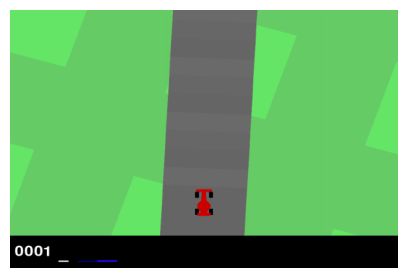

In [ ]:
eval_env = gym.make("CarRacing-v3", continuous=True, render_mode="rgb_array")
eval_env = EnvWrapper(eval_env)

total_rewards, frames = trainerDQN.play_episode(0, True, 42)
anim = animate(frames)
HTML(anim.to_jshtml())

## Double DQN (10 points)
In the original paper, where the algorithim is shown above, the estimated target Q value was computed using the current Q network's weights. However, this can lead to overestimation of the Q values. To mitigate this, we can use the target network to compute the target Q value. This is known as Double DQN.

### Hard updating Target Network (5 points)
Original implementations for this involved hard updates, where the model weights were copied to the target network every C steps. This is known as hard updating. This was what was used in the Nature Paper by Mnih et al 2015 "Human-level control through deep reinforcement learning"

Please implement this by implementing the `_optimize_model` and `_update_model` classes in `HardUpdateDQN` in `DQN.py`.

In [8]:
import torch
import utils
import DQN
import model
from env_wrapper import EnvWrapper

trainerHardUpdateDQN = DQN.HardUpdateDQN(
    EnvWrapper(env),
    model.Nature_Paper_Conv,
    update_freq=100,
    lr=0.00025,
    gamma=0.95,
    buffer_size=100000,
    batch_size=32,
    loss_fn="mse_loss",
    use_wandb=False,
    device="cuda",
    seed=42,
    epsilon_scheduler=utils.exponential_decay(1, 1000, 0.1),
    save_path=utils.get_save_path("DoubleDQN_HardUpdates/", "./runs/"),
)

trainerHardUpdateDQN.train(200, 50, 30, 50, 50)

saving to ./runs/DoubleDQN_HardUpdates/run0
Episode: 0: Time: 8.54214596748352 Total Reward: -37.44604316546784 Avg_Loss: 0.0
Episode: 1: Time: 13.665283918380737 Total Reward: -37.307692307692534 Avg_Loss: 0.7895455082320864
Episode: 2: Time: 10.520314693450928 Total Reward: -65.80291970802982 Avg_Loss: 0.7320557447862538
Episode: 3: Time: 10.334953546524048 Total Reward: -55.71428571428615 Avg_Loss: 0.6504936767898563
Episode: 4: Time: 11.159083127975464 Total Reward: -14.19191919191968 Avg_Loss: 0.7207138872384524
Episode: 5: Time: 10.432624340057373 Total Reward: -66.83098591549353 Avg_Loss: 0.6948523190060333
Episode: 6: Time: 10.758337020874023 Total Reward: -22.48091603053488 Avg_Loss: 0.7536190848390595
Episode: 7: Time: 10.532386779785156 Total Reward: 30.000000000001762 Avg_Loss: 0.7883857493640996
Episode: 8: Time: 10.356806993484497 Total Reward: -69.63768115942077 Avg_Loss: 0.7857124762875694
Episode: 9: Time: 10.892056703567505 Total Reward: 30.000000000001286 Avg_Loss: 0

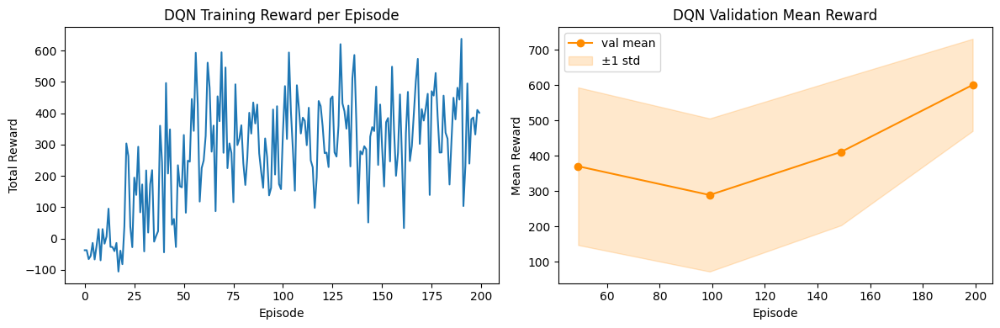

In [12]:
import re
import matplotlib.pyplot as plt

log = """
saving to ./runs/DoubleDQN_HardUpdates/run0
Episode: 0: Time: 8.54214596748352 Total Reward: -37.44604316546784 Avg_Loss: 0.0
Episode: 1: Time: 13.665283918380737 Total Reward: -37.307692307692534 Avg_Loss: 0.7895455082320864
Episode: 2: Time: 10.520314693450928 Total Reward: -65.80291970802982 Avg_Loss: 0.7320557447862538
Episode: 3: Time: 10.334953546524048 Total Reward: -55.71428571428615 Avg_Loss: 0.6504936767898563
Episode: 4: Time: 11.159083127975464 Total Reward: -14.19191919191968 Avg_Loss: 0.7207138872384524
Episode: 5: Time: 10.432624340057373 Total Reward: -66.83098591549353 Avg_Loss: 0.6948523190060333
Episode: 6: Time: 10.758337020874023 Total Reward: -22.48091603053488 Avg_Loss: 0.7536190848390595
Episode: 7: Time: 10.532386779785156 Total Reward: 30.000000000001762 Avg_Loss: 0.7883857493640996
Episode: 8: Time: 10.356806993484497 Total Reward: -69.63768115942077 Avg_Loss: 0.7857124762875694
Episode: 9: Time: 10.892056703567505 Total Reward: 30.000000000001286 Avg_Loss: 0.8209305814459544
Episode: 10: Time: 10.788702011108398 Total Reward: -16.568627450981047 Avg_Loss: 0.8844160637622621
Episode: 11: Time: 10.887764692306519 Total Reward: 6.083032490975471 Avg_Loss: 0.939824263526111
Episode: 12: Time: 11.218912363052368 Total Reward: 95.33232628399023 Avg_Loss: 0.9423638684909885
Episode: 13: Time: 10.360798358917236 Total Reward: -26.740614334471665 Avg_Loss: 0.9754014582443638
Episode: 14: Time: 10.142564296722412 Total Reward: -27.203389830509227 Avg_Loss: 0.9869524522864518
Episode: 15: Time: 10.876650333404541 Total Reward: -40.33762057877854 Avg_Loss: 1.1032097212531988
Episode: 16: Time: 10.95014762878418 Total Reward: -14.298245614035828 Avg_Loss: 1.1505241586881525
Episode: 17: Time: 7.855959177017212 Total Reward: -105.59322033898358 Avg_Loss: 1.1035881926390259
Episode: 18: Time: 10.524097204208374 Total Reward: -38.92523364486051 Avg_Loss: 1.0408016182169193
Episode: 19: Time: 10.721463203430176 Total Reward: -82.05501618122946 Avg_Loss: 2.6284579839087834
Episode: 20: Time: 10.30317234992981 Total Reward: 38.802816901411376 Avg_Loss: 3.6878793114373662
Episode: 21: Time: 10.824197769165039 Total Reward: 303.64864864863847 Avg_Loss: 3.741133264383348
Episode: 22: Time: 10.96559762954712 Total Reward: 263.15602836878526 Avg_Loss: 3.878139046185157
Episode: 23: Time: 10.493828296661377 Total Reward: 37.61648745520001 Avg_Loss: 2.738164856028156
Episode: 24: Time: 10.611134767532349 Total Reward: -27.692307692308322 Avg_Loss: 2.5668202669931057
Episode: 25: Time: 10.940701723098755 Total Reward: 194.377289377293 Avg_Loss: 2.8457026689493357
Episode: 26: Time: 11.076865434646606 Total Reward: 139.26573426573424 Avg_Loss: 2.791602615799223
Episode: 27: Time: 11.05917239189148 Total Reward: 293.1118881118825 Avg_Loss: 2.680230434702224
Episode: 28: Time: 11.25249695777893 Total Reward: 83.68338557994096 Avg_Loss: 2.6607689180043566
Episode: 29: Time: 10.593254804611206 Total Reward: 172.60563380282133 Avg_Loss: 2.55968197140874
Episode: 30: Time: 10.732887506484985 Total Reward: -41.23655913978567 Avg_Loss: 2.6919564931583
Episode: 31: Time: 11.262656211853027 Total Reward: 217.50000000000378 Avg_Loss: 2.840441998563895
Episode: 32: Time: 11.483362674713135 Total Reward: 19.068441064639657 Avg_Loss: 2.896861075854101
Episode: 33: Time: 11.259784936904907 Total Reward: 172.9738562091548 Avg_Loss: 3.479543414937348
Episode: 34: Time: 11.34692668914795 Total Reward: 218.2911392405111 Avg_Loss: 3.08862944898986
Episode: 35: Time: 10.892421007156372 Total Reward: -10.094339622642014 Avg_Loss: 2.988046733521614
Episode: 36: Time: 10.48418116569519 Total Reward: 7.9900332225917765 Avg_Loss: 2.5449004083120523
Episode: 37: Time: 10.887422561645508 Total Reward: 23.380062305296306 Avg_Loss: 2.4864790104016534
Episode: 38: Time: 10.871137142181396 Total Reward: 360.2238805970116 Avg_Loss: 2.771385310828185
Episode: 39: Time: 11.650875091552734 Total Reward: 243.60759493670884 Avg_Loss: 3.2371067014061103
Episode: 40: Time: 11.2582266330719 Total Reward: -44.09090909090982 Avg_Loss: 3.112580164140012
Episode: 41: Time: 11.034040212631226 Total Reward: 496.6030534351054 Avg_Loss: 3.330749101999427
Episode: 42: Time: 11.179035663604736 Total Reward: 207.63157894737134 Avg_Loss: 4.656967767897775
Episode: 43: Time: 11.147211074829102 Total Reward: 348.6363636363576 Avg_Loss: 3.0288123110262286
Episode: 44: Time: 10.719823122024536 Total Reward: 43.98305084746003 Avg_Loss: 3.378938430497626
Episode: 45: Time: 11.020358085632324 Total Reward: 62.53424657534697 Avg_Loss: 3.0012809163382075
Episode: 46: Time: 10.486643075942993 Total Reward: -27.14285714285788 Avg_Loss: 2.968223535839249
Episode: 47: Time: 11.335874080657959 Total Reward: 234.07348242811855 Avg_Loss: 3.283405403630072
Episode: 48: Time: 11.40798807144165 Total Reward: 166.90476190476565 Avg_Loss: 3.4365066067010415
Episode: 49: Time: 11.101322174072266 Total Reward: 163.50340136054854 Avg_Loss: 3.3140656870453298
Validation Mean Reward: 369.8737095469953 Validation Std Reward: 223.20587993330125
Episode: 50: Time: 11.133147478103638 Total Reward: 330.6756756756682 Avg_Loss: 3.221204365752324
Episode: 51: Time: 11.35529088973999 Total Reward: 82.37003058104021 Avg_Loss: 3.6312622988925263
Episode: 52: Time: 11.184044122695923 Total Reward: 248.53741496599045 Avg_Loss: 3.445055414899057
Episode: 53: Time: 10.789745092391968 Total Reward: 245.50179211468662 Avg_Loss: 3.1845319629216395
Episode: 54: Time: 11.172820091247559 Total Reward: 445.44117647057897 Avg_Loss: 3.8758850608553206
Episode: 55: Time: 10.697691202163696 Total Reward: 343.8489208632976 Avg_Loss: 3.692136945844698
Episode: 56: Time: 10.87157940864563 Total Reward: 593.259109311731 Avg_Loss: 4.336147264021785
Episode: 57: Time: 11.0492844581604 Total Reward: 427.9681978798552 Avg_Loss: 3.9909811475697685
Episode: 58: Time: 11.231417417526245 Total Reward: 117.99638989170066 Avg_Loss: 4.171242146932778
Episode: 59: Time: 10.887115240097046 Total Reward: 225.31250000000074 Avg_Loss: 4.359849347286866
Episode: 60: Time: 11.044599533081055 Total Reward: 249.3223443223483 Avg_Loss: 4.459794283163648
Episode: 61: Time: 11.152991771697998 Total Reward: 327.5806451612839 Avg_Loss: 4.810562877594924
Episode: 62: Time: 11.087942838668823 Total Reward: 561.6666666666576 Avg_Loss: 4.225412685831054
Episode: 63: Time: 10.926031112670898 Total Reward: 480.97173144875217 Avg_Loss: 5.6914344995963475
Episode: 64: Time: 10.788143396377563 Total Reward: 277.4832214765036 Avg_Loss: 5.008593130011518
Episode: 65: Time: 11.281542778015137 Total Reward: 360.6962025316425 Avg_Loss: 4.818093849330389
Episode: 66: Time: 11.314161539077759 Total Reward: 87.33618233618147 Avg_Loss: 5.141564510950522
Episode: 67: Time: 10.87118411064148 Total Reward: 454.1525423728734 Avg_Loss: 4.910817107733558
Episode: 68: Time: 10.783656120300293 Total Reward: 374.75088967971317 Avg_Loss: 4.681119263673029
Episode: 69: Time: 10.532939434051514 Total Reward: 594.795918367334 Avg_Loss: 4.470685207042374
Episode: 70: Time: 10.712886095046997 Total Reward: 273.82129277565554 Avg_Loss: 4.944419020865144
Episode: 71: Time: 10.879494667053223 Total Reward: 546.3043478260811 Avg_Loss: 4.539010374485946
Episode: 72: Time: 11.052407264709473 Total Reward: 224.74921630094528 Avg_Loss: 5.424393341821783
Episode: 73: Time: 11.11617398262024 Total Reward: 303.713826366554 Avg_Loss: 5.693158017487085
Episode: 74: Time: 10.788648128509521 Total Reward: 273.0555555555474 Avg_Loss: 5.021639710213957
Episode: 75: Time: 10.995175838470459 Total Reward: 116.07266435986551 Avg_Loss: 5.7614553225140615
Episode: 76: Time: 11.714094400405884 Total Reward: 492.49999999999187 Avg_Loss: 5.326898606885381
Episode: 77: Time: 11.662649393081665 Total Reward: 298.44262295080966 Avg_Loss: 4.898980609509123
Episode: 78: Time: 11.359779119491577 Total Reward: 318.79310344827195 Avg_Loss: 4.905047675140765
Episode: 79: Time: 11.362870216369629 Total Reward: 361.6666666666669 Avg_Loss: 4.690973271842764
Episode: 80: Time: 11.719165563583374 Total Reward: 240.38461538461888 Avg_Loss: 5.041264802467923
Episode: 81: Time: 11.369961500167847 Total Reward: 171.02564102564529 Avg_Loss: 4.8514091081979895
Episode: 82: Time: 11.149940967559814 Total Reward: 257.11267605634225 Avg_Loss: 4.499339604578099
Episode: 83: Time: 11.06404447555542 Total Reward: 401.6666666666595 Avg_Loss: 4.9020242385503625
Episode: 84: Time: 11.437901496887207 Total Reward: 335.2670623145401 Avg_Loss: 5.309123665344815
Episode: 85: Time: 11.527536153793335 Total Reward: 434.41176470587806 Avg_Loss: 5.30268589037807
Episode: 86: Time: 11.041190147399902 Total Reward: 367.54071661237816 Avg_Loss: 4.816687573404873
Episode: 87: Time: 10.978285551071167 Total Reward: 427.8070175438512 Avg_Loss: 4.971974469032608
Episode: 88: Time: 11.070672273635864 Total Reward: 271.8831168831202 Avg_Loss: 5.028591833194764
Episode: 89: Time: 10.944636106491089 Total Reward: 213.27067669173397 Avg_Loss: 4.892376523558833
Episode: 90: Time: 11.130789756774902 Total Reward: 162.05329153605248 Avg_Loss: 4.959677913609673
Episode: 91: Time: 10.576351881027222 Total Reward: 319.72868217054094 Avg_Loss: 5.2807084752731965
Episode: 92: Time: 10.615947961807251 Total Reward: 260.31135531135754 Avg_Loss: 4.804809954486975
Episode: 93: Time: 11.04710054397583 Total Reward: 137.87671232876784 Avg_Loss: 4.666465341043072
Episode: 94: Time: 11.10645604133606 Total Reward: 161.5789473684223 Avg_Loss: 4.667558993111138
Episode: 95: Time: 11.181587219238281 Total Reward: 412.09219858155404 Avg_Loss: 4.495806817247086
Episode: 96: Time: 11.309892654418945 Total Reward: 204.38271604938652 Avg_Loss: 4.864428448076008
Episode: 97: Time: 10.814208269119263 Total Reward: 422.60563380280905 Avg_Loss: 4.78976070830802
Episode: 98: Time: 11.18207836151123 Total Reward: 173.88217522659025 Avg_Loss: 5.0283251474885375
Episode: 99: Time: 10.538893699645996 Total Reward: 157.63157894737208 Avg_Loss: 4.997394060387331
Validation Mean Reward: 288.46517268947883 Validation Std Reward: 216.7410970448456
Episode: 100: Time: 11.048174142837524 Total Reward: 342.2881355932178 Avg_Loss: 4.3919867126881575
Episode: 101: Time: 11.128527641296387 Total Reward: 486.88153310103655 Avg_Loss: 4.907894761622453
Episode: 102: Time: 10.879825115203857 Total Reward: 317.96928327644855 Avg_Loss: 5.003191703007001
Episode: 103: Time: 10.93523120880127 Total Reward: 594.189189189176 Avg_Loss: 4.501336216926575
Episode: 104: Time: 11.008280277252197 Total Reward: 404.9999999999934 Avg_Loss: 4.675399308945952
Episode: 105: Time: 10.914026737213135 Total Reward: 283.09187279152167 Avg_Loss: 4.931727005153143
Episode: 106: Time: 11.22828483581543 Total Reward: 152.88732394366633 Avg_Loss: 4.8794159638781505
Episode: 107: Time: 10.699505805969238 Total Reward: 489.558823529404 Avg_Loss: 5.057509375720465
Episode: 108: Time: 10.907672882080078 Total Reward: 418.51351351351053 Avg_Loss: 5.215547855160818
Episode: 109: Time: 11.10127305984497 Total Reward: 335.5555555555463 Avg_Loss: 4.773150955929475
Episode: 110: Time: 11.224476099014282 Total Reward: 386.0495626822101 Avg_Loss: 5.094323869011983
Episode: 111: Time: 11.004536628723145 Total Reward: 375.7792207792182 Avg_Loss: 5.010070635491059
Episode: 112: Time: 10.912708282470703 Total Reward: 298.1034482758639 Avg_Loss: 6.100818967618862
Episode: 113: Time: 10.908862113952637 Total Reward: 417.72727272726524 Avg_Loss: 5.387121457512639
Episode: 114: Time: 11.207390785217285 Total Reward: 249.61538461538274 Avg_Loss: 5.423931472942609
Episode: 115: Time: 11.06166124343872 Total Reward: 227.4755700325777 Avg_Loss: 5.9576456767170365
Episode: 116: Time: 10.836043119430542 Total Reward: 97.72727272727633 Avg_Loss: 5.442725267730841
Episode: 117: Time: 10.945310592651367 Total Reward: 194.90228013029645 Avg_Loss: 5.23676699500124
Episode: 118: Time: 10.919507265090942 Total Reward: 439.2465753424588 Avg_Loss: 5.131801600716695
Episode: 119: Time: 11.020539999008179 Total Reward: 422.8571428571326 Avg_Loss: 6.221333189170902
Episode: 120: Time: 10.971567153930664 Total Reward: 358.94736842104487 Avg_Loss: 5.4244516852523095
Episode: 121: Time: 11.308810472488403 Total Reward: 272.64705882352797 Avg_Loss: 4.816544838813173
Episode: 122: Time: 11.136379480361938 Total Reward: 274.42675159235256 Avg_Loss: 5.1186142949497
Episode: 123: Time: 10.847843647003174 Total Reward: 228.23232323232713 Avg_Loss: 5.0295745565109895
Episode: 124: Time: 11.204620599746704 Total Reward: 445.8805031446453 Avg_Loss: 5.535529238837106
Episode: 125: Time: 11.212074041366577 Total Reward: 453.8215488215386 Avg_Loss: 5.340160728001795
Episode: 126: Time: 11.134476661682129 Total Reward: 275.0305810397584 Avg_Loss: 6.244486197203147
Episode: 127: Time: 11.095331907272339 Total Reward: 261.68789808917325 Avg_Loss: 5.528041845109282
Episode: 128: Time: 11.17694640159607 Total Reward: 360.445544554452 Avg_Loss: 6.052433782765846
Episode: 129: Time: 10.861838817596436 Total Reward: 620.7894736841977 Avg_Loss: 5.999709125326461
Episode: 130: Time: 10.969336032867432 Total Reward: 431.50176678444217 Avg_Loss: 5.540407926094632
Episode: 131: Time: 11.21718144416809 Total Reward: 406.63934426228946 Avg_Loss: 5.326401178576365
Episode: 132: Time: 11.218247175216675 Total Reward: 350.85987261145976 Avg_Loss: 5.216453465593963
Episode: 133: Time: 10.773267030715942 Total Reward: 424.4346289752601 Avg_Loss: 5.052551454355736
Episode: 134: Time: 10.940362453460693 Total Reward: 230.25951557093822 Avg_Loss: 5.188686410919959
Episode: 135: Time: 10.833976745605469 Total Reward: 511.74157303369805 Avg_Loss: 5.149612108198535
Episode: 136: Time: 10.841776847839355 Total Reward: 586.1023622047178 Avg_Loss: 4.7560157009533475
Episode: 137: Time: 10.657006025314331 Total Reward: 371.13545816732824 Avg_Loss: 5.199621304243553
Episode: 138: Time: 11.318052291870117 Total Reward: 112.31707317073591 Avg_Loss: 5.688165577018962
Episode: 139: Time: 11.019706010818481 Total Reward: 279.23312883435835 Avg_Loss: 5.193626801506812
Episode: 140: Time: 11.624971628189087 Total Reward: 268.8888888888908 Avg_Loss: 5.022324031140624
Episode: 141: Time: 11.157351732254028 Total Reward: 294.65517241379337 Avg_Loss: 4.973550614188699
Episode: 142: Time: 11.202499628067017 Total Reward: 284.999999999997 Avg_Loss: 5.300252412046705
Episode: 143: Time: 11.804219961166382 Total Reward: 51.268656716417404 Avg_Loss: 5.117508456486614
Episode: 144: Time: 10.962335109710693 Total Reward: 325.3389830508444 Avg_Loss: 5.428434444074871
Episode: 145: Time: 10.704883575439453 Total Reward: 355.81967213114496 Avg_Loss: 5.328816261612067
Episode: 146: Time: 11.394572496414185 Total Reward: 343.2352941176438 Avg_Loss: 5.388945207375438
Episode: 147: Time: 11.020514965057373 Total Reward: 485.1282051282004 Avg_Loss: 4.993823254308781
Episode: 148: Time: 11.100340127944946 Total Reward: 234.99999999999994 Avg_Loss: 5.293241549439791
Episode: 149: Time: 10.939809560775757 Total Reward: 427.9681978798537 Avg_Loss: 5.44796804870878
Validation Mean Reward: 410.6432333860118 Validation Std Reward: 207.8787903511116
Episode: 150: Time: 10.917620420455933 Total Reward: 290.6655290102386 Avg_Loss: 5.2952651546782805
Episode: 151: Time: 10.782547950744629 Total Reward: 166.36363636363964 Avg_Loss: 5.6009710997092625
Episode: 152: Time: 11.26282811164856 Total Reward: 371.472303206995 Avg_Loss: 5.612606042573432
Episode: 153: Time: 10.918258666992188 Total Reward: 384.85347985347425 Avg_Loss: 5.704138172774756
Episode: 154: Time: 10.891649723052979 Total Reward: 246.3793103448314 Avg_Loss: 5.008988806179592
Episode: 155: Time: 11.035138607025146 Total Reward: 548.8356164383467 Avg_Loss: 5.345199435698886
Episode: 156: Time: 11.04249095916748 Total Reward: 349.0298507462602 Avg_Loss: 6.2874570739369435
Episode: 157: Time: 11.25406527519226 Total Reward: 200.384615384619 Avg_Loss: 5.851132256644113
Episode: 158: Time: 10.830447912216187 Total Reward: 273.79432624113673 Avg_Loss: 5.856073487706545
Episode: 159: Time: 10.80402398109436 Total Reward: 460.1470588235252 Avg_Loss: 5.535603648474236
Episode: 160: Time: 10.98772382736206 Total Reward: 257.9411764705819 Avg_Loss: 5.985777531351362
Episode: 161: Time: 11.169570207595825 Total Reward: 33.37837837837834 Avg_Loss: 5.579894390426764
Episode: 162: Time: 11.10393500328064 Total Reward: 337.43243243243006 Avg_Loss: 6.130955207247694
Episode: 163: Time: 11.06802225112915 Total Reward: 468.33333333332513 Avg_Loss: 5.527068389564001
Episode: 164: Time: 10.896463871002197 Total Reward: 247.56055363321082 Avg_Loss: 5.189831876955113
Episode: 165: Time: 11.400593757629395 Total Reward: 295.76923076922725 Avg_Loss: 5.302432245567065
Episode: 166: Time: 11.23322057723999 Total Reward: 400.3271028037339 Avg_Loss: 5.557667021991826
Episode: 167: Time: 11.268393754959106 Total Reward: 502.2696245733664 Avg_Loss: 5.98710900745472
Episode: 168: Time: 11.383241653442383 Total Reward: 573.8963210702262 Avg_Loss: 6.428655134529627
Episode: 169: Time: 11.395023345947266 Total Reward: 302.26027397259867 Avg_Loss: 5.876505845735053
Episode: 170: Time: 11.093125820159912 Total Reward: 413.1300813008068 Avg_Loss: 6.160562498228891
Episode: 171: Time: 12.216202735900879 Total Reward: 376.8100890207672 Avg_Loss: 6.496355371314938
Episode: 172: Time: 11.780301570892334 Total Reward: 415.7142857142718 Avg_Loss: 6.427311503586649
Episode: 173: Time: 11.356881141662598 Total Reward: 462.1955719557079 Avg_Loss: 6.726475382051548
Episode: 174: Time: 11.661042928695679 Total Reward: 139.1269841269883 Avg_Loss: 6.343676054177164
Episode: 175: Time: 11.769551277160645 Total Reward: 470.54307116103905 Avg_Loss: 5.8875645679586075
Episode: 176: Time: 11.892407655715942 Total Reward: 456.60142348753647 Avg_Loss: 6.22776092250808
Episode: 177: Time: 11.789766311645508 Total Reward: 528.6162361623528 Avg_Loss: 5.956527259169507
Episode: 178: Time: 11.868921279907227 Total Reward: 389.94983277591876 Avg_Loss: 6.03636238154243
Episode: 179: Time: 12.257909297943115 Total Reward: 274.636963696371 Avg_Loss: 6.15644736049556
Episode: 180: Time: 12.416735172271729 Total Reward: 274.90595611285215 Avg_Loss: 6.355896959785654
Episode: 181: Time: 11.875874996185303 Total Reward: 456.36986301369296 Avg_Loss: 6.068880570035021
Episode: 182: Time: 12.00323224067688 Total Reward: 337.98969072164874 Avg_Loss: 5.732068375879977
Episode: 183: Time: 12.598262071609497 Total Reward: 318.7931034482722 Avg_Loss: 5.572579478516298
Episode: 184: Time: 11.681972742080688 Total Reward: 172.48971193416003 Avg_Loss: 5.8176412902960255
Episode: 185: Time: 12.15954852104187 Total Reward: 314.5940959409537 Avg_Loss: 5.37266768527632
Episode: 186: Time: 12.674500703811646 Total Reward: 449.5859872611315 Avg_Loss: 5.486531937823576
Episode: 187: Time: 12.471388578414917 Total Reward: 380.7575757575708 Avg_Loss: 5.889841374228983
Episode: 188: Time: 11.553150415420532 Total Reward: 481.3888888888823 Avg_Loss: 5.580363536582274
Episode: 189: Time: 11.562740802764893 Total Reward: 443.73239436618763 Avg_Loss: 5.6573163912075906
Episode: 190: Time: 11.39323616027832 Total Reward: 637.8519855595557 Avg_Loss: 5.768493637818248
Episode: 191: Time: 12.141102313995361 Total Reward: 103.6301369863047 Avg_Loss: 5.623727755887168
Episode: 192: Time: 11.799457311630249 Total Reward: 232.04402515723527 Avg_Loss: 6.0601124412873215
Episode: 193: Time: 11.595938444137573 Total Reward: 495.2255639097601 Avg_Loss: 6.443539262819691
Episode: 194: Time: 12.105494499206543 Total Reward: 239.36532507740242 Avg_Loss: 5.748269241397121
Episode: 195: Time: 11.659831523895264 Total Reward: 380.8620689655106 Avg_Loss: 5.965141764208048
Episode: 196: Time: 11.623232364654541 Total Reward: 386.75182481751574 Avg_Loss: 5.5722072805677145
Episode: 197: Time: 12.24781322479248 Total Reward: 332.3504273504267 Avg_Loss: 6.053249748815007
Episode: 198: Time: 11.722429513931274 Total Reward: 410.61797752808343 Avg_Loss: 5.406935606183124
Episode: 199: Time: 11.985321760177612 Total Reward: 401.81528662419504 Avg_Loss: 5.7327542004465055
Validation Mean Reward: 600.2135880286602 Validation Std Reward: 130.42469740152583
Test Mean Reward: 605.573884517179 Test Std Reward: 153.7664459544566

"""

episodes, rewards, val_episodes, val_rewards, val_stds = [], [], [], [], []

for line in log.strip().split('\n'):
    m = re.search(r'Episode:\s*(\d+):.*Total Reward:\s*([\d\.\-]+)', line)
    if m:
        episodes.append(int(m.group(1)))
        rewards.append(float(m.group(2)))
    m = re.search(r'Validation Mean Reward:\s*([\d\.\-]+).*Std Reward:\s*([\d\.\-e]+)', line)
    if m:
        val_episodes.append(episodes[-1] if episodes else 0)
        val_rewards.append(float(m.group(1)))
        val_stds.append(float(m.group(2)))

val_rewards = np.array(val_rewards)
val_stds = np.array(val_stds)

plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(episodes, rewards)
plt.title("DQN Training Reward per Episode")
plt.xlabel("Episode")
plt.ylabel("Total Reward")

plt.subplot(1, 2, 2)
plt.plot(val_episodes, val_rewards, marker='o', color='darkorange', label='val mean')
plt.fill_between(val_episodes, val_rewards - val_stds, val_rewards + val_stds,
                 alpha=0.2, color='darkorange', label='±1 std')
plt.title("DQN Validation Mean Reward")
plt.xlabel("Episode")
plt.ylabel("Mean Reward")
plt.legend()

plt.tight_layout()
plt.show()

#### Animation

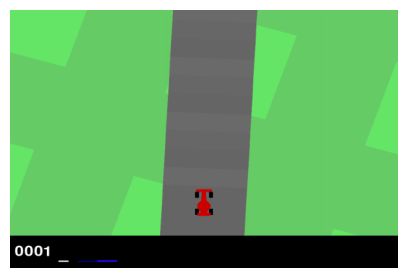

In [10]:
total_rewards, frames = trainerHardUpdateDQN.play_episode(0, True, 42)
anim = animate(frames)
HTML(anim.to_jshtml())

### Soft Updates (5 points)
A more recent improvement is to use soft updates, also known as Polyak averaging, where the target network is updated with a small fraction of the current model weights every step. In other words:
$$\theta_{target} = \tau \theta_{model} + (1-\tau) \theta_{target}$$
for some $\tau << 1$
Please implement this by implementing the `_update_model` class in `SoftUpdateDQN` in `DQN.py`.

In [ ]:
import torch
import utils
import DQN
import model
from env_wrapper import EnvWrapper

traineSoftUpdateDQN = DQN.SoftUpdateDQN(
    EnvWrapper(env),
    model.Nature_Paper_Conv,
    tau=0.01,
    update_freq=1,
    lr=0.00025,
    gamma=0.95,
    buffer_size=100000,  # You can take smaller buffer size if you encounter RAM explosion
    batch_size=32,
    loss_fn="mse_loss",
    use_wandb=False,
    device="cuda",
    seed=42,
    epsilon_scheduler=utils.exponential_decay(1, 1000, 0.1),
    save_path=utils.get_save_path("DoubleDQN_SoftUpdates", "./runs/"),
)

traineSoftUpdateDQN.train(200, 50, 30, 50, 50)

#### Animation

In [ ]:
total_rewards, frames = traineSoftUpdateDQN.play_episode(0, True, 42)
anim = animate(frames)
HTML(anim.to_jshtml())

## Questions (10 points)
- Which method performed better? (5 points)

Your answer:

- If we modify the $\tau$ for soft updates **or** the $C$ for the hard updates, how does this affect the performance of the model, come up with a intuition for this, then experimentally verify this.
 (5 points)

Your answer: